# Importing datasets from Kaggle

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from google.colab import files

files.upload() #this will prompt you to upload the kaggle.json

Saving kaggle.json to kaggle (1).json


{'kaggle (1).json': b'{"username":"carvalhobr","key":"774e09805e4d6e369c78cc7f086c7485"}'}

In [ ]:
!ls -lha kaggle.json

-rw-r--r-- 1 root root 66 Jul 25 13:39 kaggle.json


In [ ]:
!pip install -q kaggle

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

In [ ]:
!chmod 600 /root/.kaggle/kaggle.json

In [ ]:
!pwd

/content


In [ ]:
!kaggle datasets list

ref                                                             title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
alphiree/cardiovascular-diseases-risk-prediction-dataset        Cardiovascular Diseases Risk Prediction Dataset       5MB  2023-07-03 12:12:19           5417        223  1.0              
nelgiriyewithana/countries-of-the-world-2023                    Global Country Information Dataset 2023              23KB  2023-07-08 20:37:33           4198        153  1.0              
byomokeshsenapati/spotify-song-attributes                       Spotify Song Attributes                             883KB  2023-07-09 16:00:20           1130         35  1.0              
arnavsmayan/netflix-userbase-dataset                        

In [ ]:
!kaggle datasets download -d navoneel/brain-mri-images-for-brain-tumor-detection
!unzip brain-mri-images-for-brain-tumor-detection.zip

 66% 10.0M/15.1M [00:00<00:00, 102MB/s]
100% 15.1M/15.1M [00:00<00:00, 127MB/s]
Archive:  brain-mri-images-for-brain-tumor-detection.zip
  inflating: brain_tumor_dataset/no/1 no.jpeg  
  inflating: brain_tumor_dataset/no/10 no.jpg  
  inflating: brain_tumor_dataset/no/11 no.jpg  
  inflating: brain_tumor_dataset/no/12 no.jpg  
  inflating: brain_tumor_dataset/no/13 no.jpg  
  inflating: brain_tumor_dataset/no/14 no.jpg  
  inflating: brain_tumor_dataset/no/15 no.jpg  
  inflating: brain_tumor_dataset/no/17 no.jpg  
  inflating: brain_tumor_dataset/no/18 no.jpg  
  inflating: brain_tumor_dataset/no/19 no.jpg  
  inflating: brain_tumor_dataset/no/2 no.jpeg  
  inflating: brain_tumor_dataset/no/20 no.jpg  
  inflating: brain_tumor_dataset/no/21 no.jpg  
  inflating: brain_tumor_dataset/no/22 no.jpg  
  inflating: brain_tumor_dataset/no/23 no.jpg  
  inflating: brain_tumor_dataset/no/24 no.jpg  
  inflating: brain_tumor_dataset/no/25 no.jpg  
  inflating: brain_tumor_dataset/no/26 no.jpg  

In [ ]:
!kaggle datasets download -d denizkavi1/brain-tumor
!unzip brain-tumor.zip

100% 697M/700M [00:07<00:00, 105MB/s]
100% 700M/700M [00:07<00:00, 103MB/s]
Archive:  brain-tumor.zip
  inflating: 1/2300.png              
  inflating: 1/2301.png              
  inflating: 1/2302.png              
  inflating: 1/2303.png              
  inflating: 1/2304.png              
  inflating: 1/2305.png              
  inflating: 1/2306.png              
  inflating: 1/2307.png              
  inflating: 1/2308.png              
  inflating: 1/2309.png              
  inflating: 1/2310.png              
  inflating: 1/2311.png              
  inflating: 1/2312.png              
  inflating: 1/2313.png              
  inflating: 1/2314.png              
  inflating: 1/2315.png              
  inflating: 1/2316.png              
  inflating: 1/2317.png              
  inflating: 1/2318.png              
  inflating: 1/2319.png              
  inflating: 1/2320.png              
  inflating: 1/2321.png              
  inflating: 1/2322.png              
  inflating: 1/2323.png 

# **Brain Tumor Image Dataset** (https://www.kaggle.com/datasets/denizkavi1/brain-tumor/code?datasetId=1454010&sortBy=voteCount)
# 1 = Meningioma
# 2 = Glioma
# 3 = Pituitary tumor

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import random
import os
from IPython.display import Image

In [ ]:
!ls

 1						  drive
 2						 'kaggle (1).json'
 3						  kaggle.json
 brain-mri-images-for-brain-tumor-detection.zip   no
 brain_tumor_dataset				  sample_data
 brain-tumor.zip				  yes


In [ ]:
folder1 = '/kaggle.json/1'
folder2 = '/kaggle.json/2'
folder3 = '/kaggle.json/3'

In [ ]:
folder = folder1
def get_folder(folder):
    plt.figure(figsize=(11,11))
    for i in range(100):
        file = random.choice(os.listdir(folder))
        image_path= os.path.join(folder, file)
        img=mpimg.imread(image_path)
        ax=plt.subplot(10,10,i+1)
        ax.title.set_text(file)
        plt.imshow(img)

(708, None)

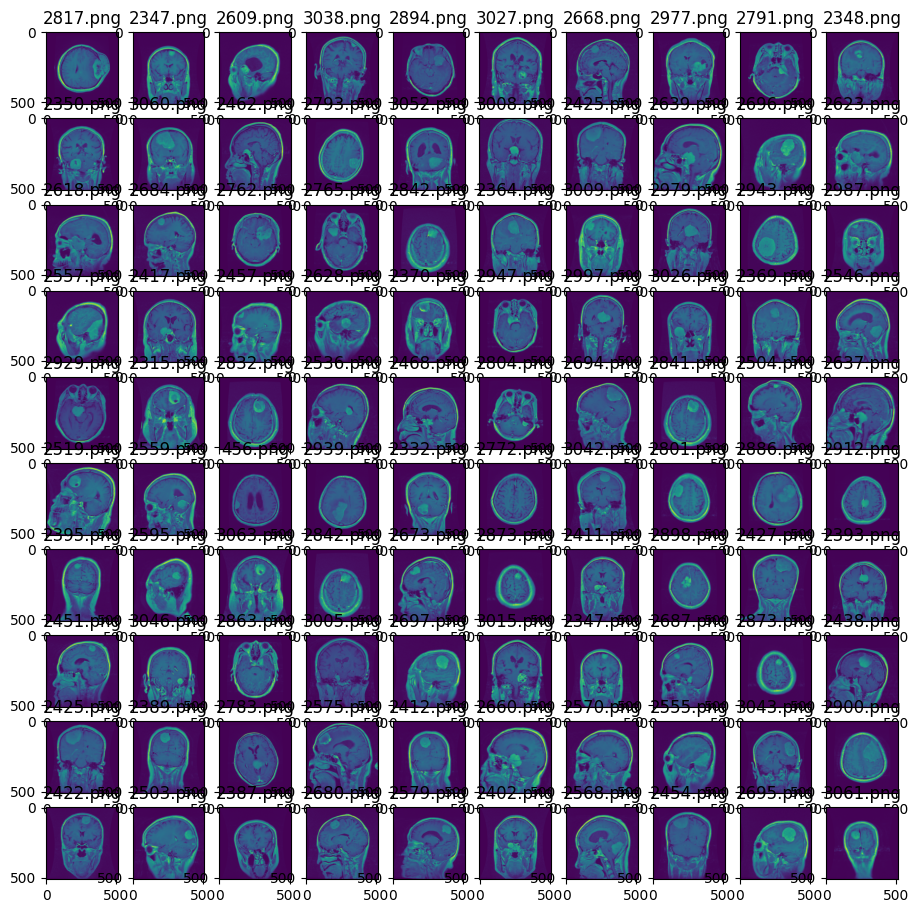

In [ ]:
files = os.listdir('1')
np.size(files), get_folder('1')

(1426, None)

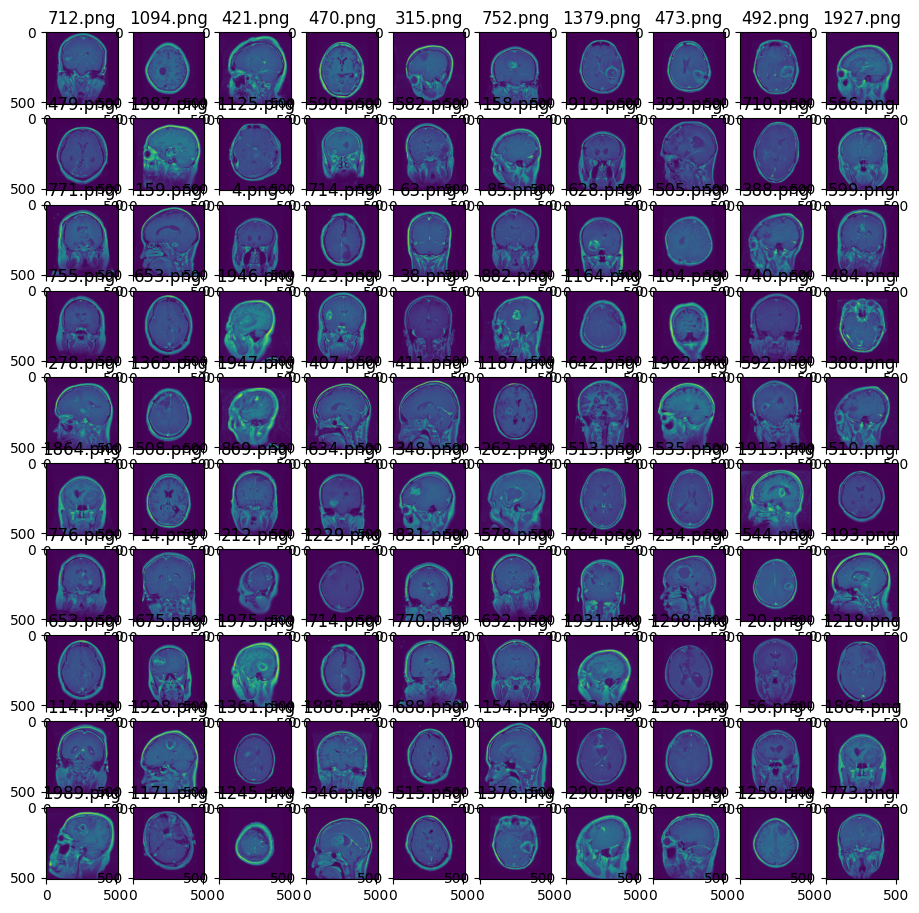

In [ ]:
files = os.listdir('2')
np.size(files), get_folder('2')

In [ ]:
files = os.listdir('3')
np.size(files), get_folder('3')

(930, None)

# **Segmentation**

In [198]:
import pandas as pd
from sklearn.cluster import KMeans

segmented_images=[]
folder = folder1
def kmean_seg(folder):
    plt.figure(figsize=(11,11))
    for i in range(100):
        file = random.choice(os.listdir(folder))
        image_path= os.path.join(folder, file)
        image_seg=mpimg.imread(image_path)
        # print(np.unique(image_seg))
        #print('image_seg', image_seg)
        # image_seg= np.array(img)
        pixels = image_seg.reshape(-1, 4)
        pixels_df = pd.DataFrame(pixels, columns=['R', 'G', 'B','A'])
        # print('pixels_df', pixels_df)


        clf = KMeans(n_clusters=3, n_init='auto')
        clf.fit(pixels)
        pixels_seg0 = clf.cluster_centers_[clf.labels_]
        # print('pixels_seg0', pixels_seg0)
        # pixels_seg = np.clip(pixels_seg0.astype('uint8'), 0, 255)
        # print('pixels_seg', pixels_seg)
        image_seg2 = pixels_seg0.reshape(image_seg.shape)
        #print(np.unique(image_seg2))
        #print('image_seg2', image_seg2)
        segmented_images.append(image_seg2)

        #ax=plt.subplot(10,10,i+1)
        #ax.title.set_text(file)

        plt.figure(figsize=(5, 5))
        plt.subplot(1, 2, 1)
        plt.imshow(image_seg)
        plt.title('Original picture')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(image_seg2)
        plt.title('Segmented Picture')
        plt.axis('off')

        plt.show()


<Figure size 1100x1100 with 0 Axes>

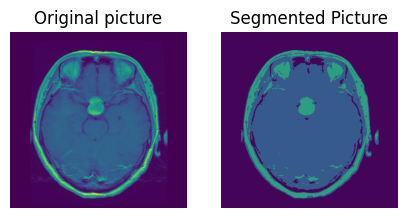

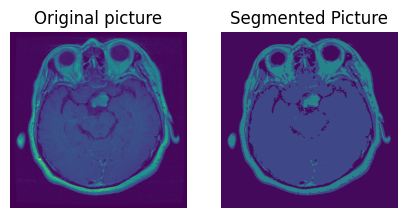

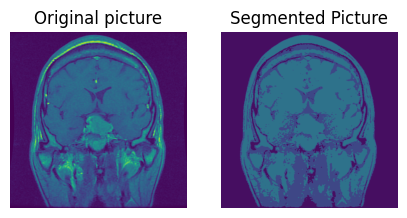

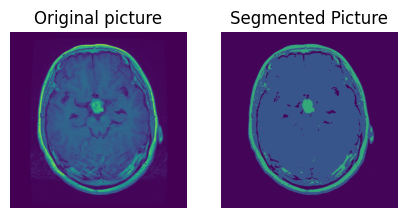

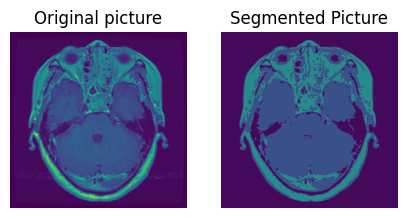

...

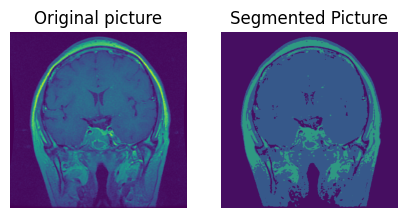

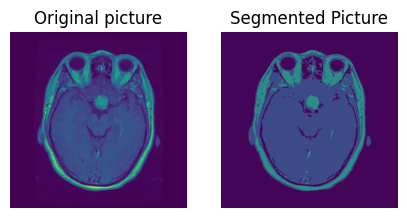

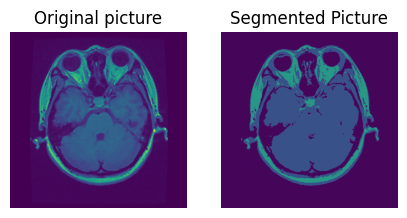

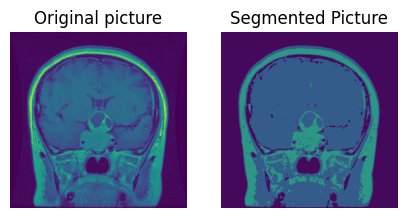

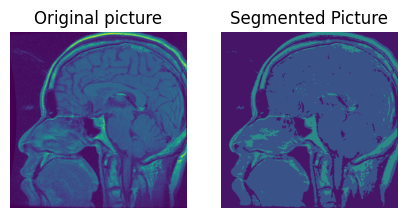

(930, None)

In [199]:
files = os.listdir('3')
np.size(files), kmean_seg('3')

# **Augmentation**

In [204]:
import cv2
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import img_to_array
from tensorflow.keras.utils import array_to_img

augmented_arr_images=[]
augmented_images=[]
folder = folder1
def aug_image():
    plt.figure(figsize=(11,11))
    prime_path = os.path.join('/content','2prime')
    if not os.path.exists(prime_path):
        os.mkdir(prime_path)
        print("created")

    for i in range(0,len(segmented_images)):
        #file = random.choice(os.listdir(folder))
        #image_path= os.path.join(folder, file)
        aug = ImageDataGenerator(channel_shift_range=0.2,width_shift_range=0.1, height_shift_range=0.1, rotation_range = 10,shear_range = 0.15,zoom_range = 0.5)

        img=segmented_images[i]
        #img=cv2.imread(imgr)
        # image = load_img(image_path)
        # print(image)
        # arrimage=img_to_array(image)
        # print(img)
        # print(img.shape)
        # print(type(img))
        arrimage= img.reshape((1, ) + img.shape)
        # print(arrimage)
        # print(arrimage.shape)
        new_image= aug.flow(arrimage)
        # print(new_image)
        image1 = next(new_image)[0]
        # print(image1)
        # print(image1.shape)
        #os.chdir(prime_path)
        img_path = os.path.join(prime_path,f'{i}.png')
        print('image1', image1)
        mpimg.imsave(arr=image1, fname=img_path)
        # cv2.imwrite(img_path, image1[:, :, :3])

        augmented_arr_images.append(image1)
        image11=array_to_img(image1)
        augmented_images.append(image11)

        ax=plt.subplot(10,10,i+1)
        ax.title.set_text('off')
        plt.imshow(image1)



image1 [[[0.09834969 0.01641643 0.17221335 0.8298758 ]
  [0.09834969 0.01641643 0.17221335 0.8298758 ]
  [0.09834969 0.01641643 0.17221335 0.8298758 ]
  ...
  [0.09834969 0.01641643 0.17221335 0.8298758 ]
  [0.09834969 0.01641643 0.17221335 0.8298758 ]
  [0.09834969 0.01641643 0.17221335 0.8298758 ]]

 [[0.09834969 0.01641643 0.17221335 0.8298758 ]
  [0.09834969 0.01641643 0.17221335 0.8298758 ]
  [0.09834969 0.01641643 0.17221335 0.8298758 ]
  ...
  [0.09834969 0.01641643 0.17221335 0.8298758 ]
  [0.09834969 0.01641643 0.17221335 0.8298758 ]
  [0.09834969 0.01641643 0.17221335 0.8298758 ]]

 [[0.09834969 0.01641643 0.17221335 0.8298758 ]
  [0.09834969 0.01641643 0.17221335 0.8298758 ]
  [0.09834969 0.01641643 0.17221335 0.8298758 ]
  ...
  [0.09834969 0.01641643 0.17221335 0.8298758 ]
  [0.09834969 0.01641643 0.17221335 0.8298758 ]
  [0.09834969 0.01641643 0.17221335 0.8298758 ]]

 ...

 [[0.09834969 0.01641643 0.17221335 0.8298758 ]
  [0.09834969 0.01641643 0.17221335 0.8298758 ]
  [

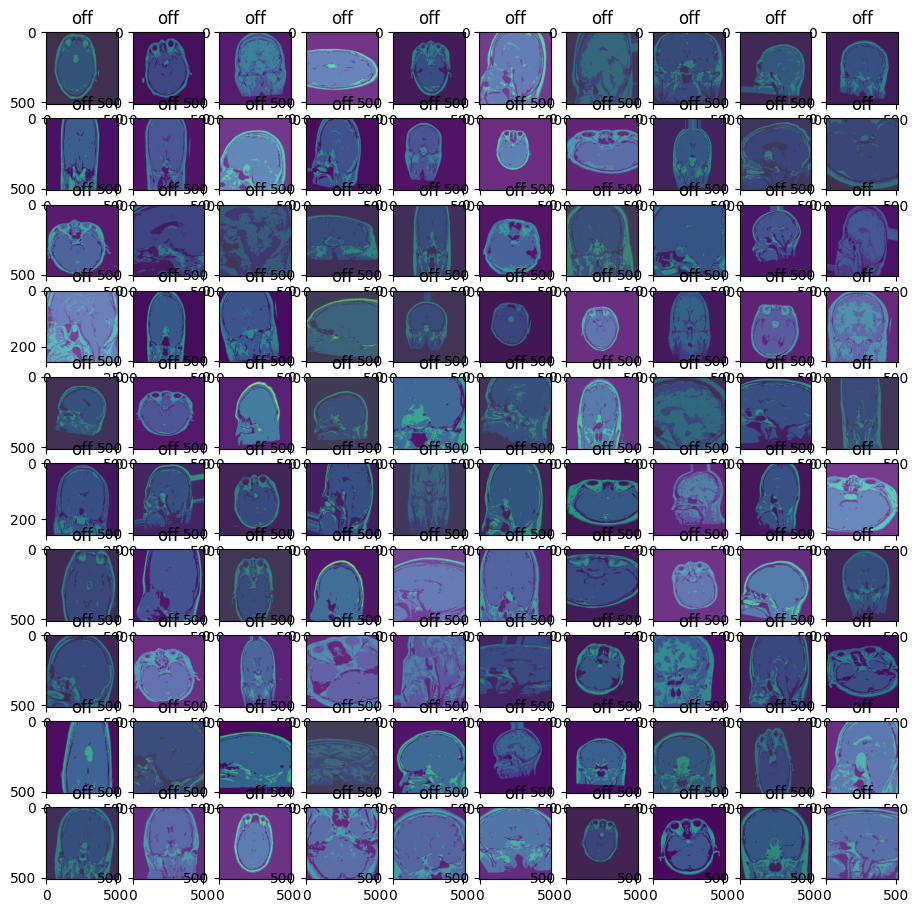

In [205]:
aug_image()


# **Enhancing**

In [206]:
import cv2
from os.path import isfile, join
from os import listdir


def enhance_image():
  plt.figure(figsize=(11,11))
  img_address=os.listdir('/content/2prime')

  for i in range(0,len(img_address)):
    #print(new_path)
    new_path=os.path.join('/content/2prime',img_address[i])
    # image_seg=mpimg.imread(new_path)
    # print(new_path)

    img_gr = cv2.imread(new_path,cv2.IMREAD_GRAYSCALE)

    #print(new_path)

    # print('img_gr', img_gr)
    # print('img_gr', img_gr.shape)
    new_img_gr= cv2.cvtColor(img_gr, cv2.COLOR_GRAY2RGB)
    #print(new_img_gr)

    lab = cv2.cvtColor(new_img_gr, cv2.COLOR_BGR2LAB)
    #print(lab.shape)
    l_channel, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l_channel)
    limg = cv2.merge((cl,a,b))
    enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
    print(enhanced_img)
    ax=plt.subplot(10,10,i+1)
    ax.title.set_text('off')
    plt.imshow(enhanced_img)






[[[54 54 54]
  [54 54 54]
  [54 54 54]
  ...
  [54 54 54]
  [54 54 54]
  [54 54 54]]

 [[54 54 54]
  [54 54 54]
  [54 54 54]
  ...
  [54 54 54]
  [54 54 54]
  [54 54 54]]

 [[54 54 54]
  [54 54 54]
  [54 54 54]
  ...
  [54 54 54]
  [54 54 54]
  [54 54 54]]

 ...

 [[54 54 54]
  [54 54 54]
  [54 54 54]
  ...
  [54 54 54]
  [54 54 54]
  [54 54 54]]

 [[54 54 54]
  [54 54 54]
  [54 54 54]
  ...
  [54 54 54]
  [54 54 54]
  [54 54 54]]

 [[54 54 54]
  [54 54 54]
  [54 54 54]
  ...
  [54 54 54]
  [54 54 54]
  [54 54 54]]]
[[[64 64 64]
  [64 64 64]
  [64 64 64]
  ...
  [64 64 64]
  [64 64 64]
  [64 64 64]]

 [[64 64 64]
  [64 64 64]
  [64 64 64]
  ...
  [64 64 64]
  [64 64 64]
  [64 64 64]]

 [[64 64 64]
  [64 64 64]
  [64 64 64]
  ...
  [64 64 64]
  [64 64 64]
  [64 64 64]]

 ...

 [[64 64 64]
  [64 64 64]
  [64 64 64]
  ...
  [64 64 64]
  [64 64 64]
  [64 64 64]]

 [[64 64 64]
  [64 64 64]
  [64 64 64]
  ...
  [64 64 64]
  [64 64 64]
  [64 64 64]]

 [[64 64 64]
  [64 64 64]
  [64 64 64]
  .

Exception ignored in: <function _xla_gc_callback at 0x7f4cfead3ac0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/jax/_src/lib/__init__.py", line 103, in _xla_gc_callback
    def _xla_gc_callback(*args):
KeyboardInterrupt: 


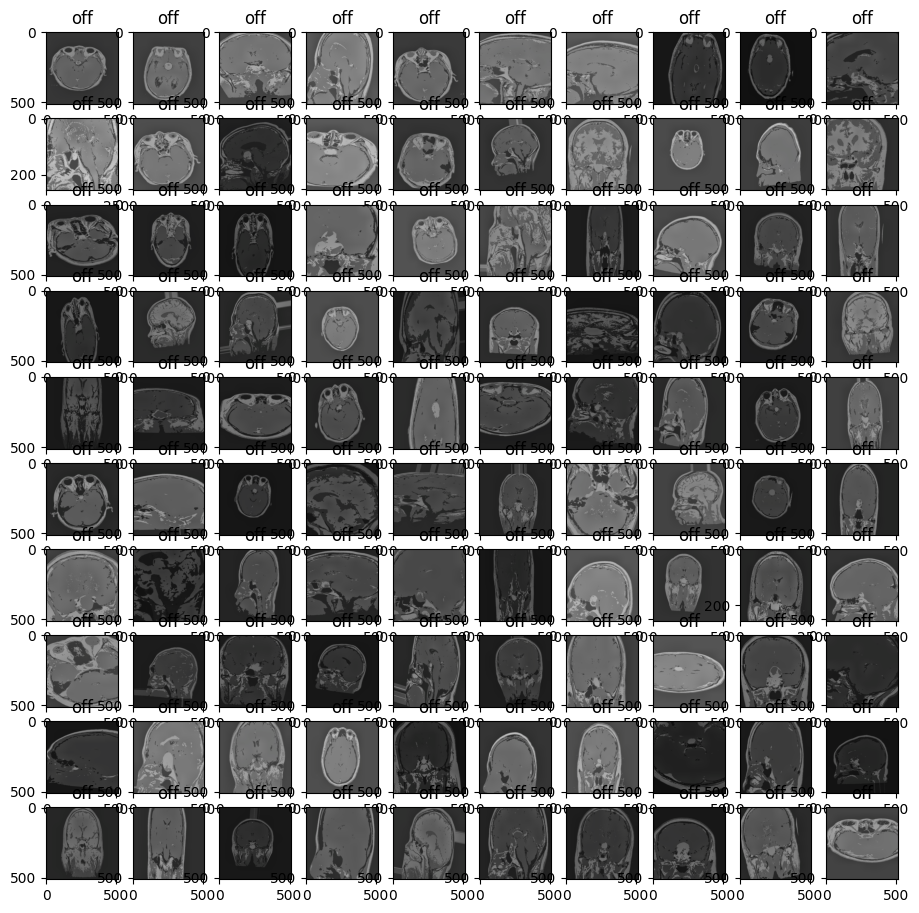

In [207]:

enhance_image()

Flip

In [ ]:
# import cv2
# folder = folder1
# def flip_image(folder):
#     plt.figure(figsize=(11,11))
#     for i in range(100):
#         file = random.choice(os.listdir(folder))
#         image_path= os.path.join(folder, file)
#         img=mpimg.imread(image_path)
#         #image = cv2.imread(image_path,1)
#         new_image2= cv2.flip(img,0)
#         ax=plt.subplot(10,10,i+1)
#         ax.title.set_text(file)
#         plt.imshow(new_image2)

In [ ]:
# files = os.listdir('1')
# np.size(files), flip_image('1')

In [ ]:
# files = os.listdir('2')
# np.size(files), flip_image('2')

In [ ]:
# files = os.listdir('3')
# np.size(files), flip_image('3')

In [ ]:
# folder = folder1
# import torch
# import torch.nn as nn
# import torchvision.transforms as T
# from PIL import Image

# def Convolution1(folder):
#     plt.figure(figsize=(11,11))
#     for i in range(100):
#         file = random.choice(os.listdir(folder))
#         image_path= os.path.join(folder, file)
#         #img=mpimg.imread(image_path)
#         #image = cv2.imread(image_path,1)

#         image3 = Image.open(image_path)
#         # convert input image to torch tensor
#         Input = T.ToTensor()(image3)
# 	      # Define the convolution operation
#         conv = nn.Conv2d(in_channels=4, out_channels=4, kernel_size=2,stride=1, bias=True)
#         output = conv(Input)
#         print('Output Tensor :',output.shape)
#         # squeeze image
#         Out_img = output.squeeze(0)
#         # convert tensor to image
#         Out_img = T.ToPILImage()(Out_img)
#         ax=plt.subplot(10,10,i+1)
#         ax.title.set_text(file)
#         plt.imshow(Out_img)


In [ ]:
# files = os.listdir('1')
# np.size(files), Convolution1('1')


# **Brain MRI Images for Brain Tumor Detection** (https://www.kaggle.com/navoneel/brain-mri-images-for-brain-tumor-detection)
# No = No tumor (0)
# Yes = Tumor (1)

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import random
import os
from IPython.display import Image

In [ ]:
!ls

In [ ]:
def get_folder(folder):
    plt.figure(figsize=(11,11))
    for i in range(100):
        file = random.choice(os.listdir(folder))
        image_path= os.path.join(folder, file)
        img=mpimg.imread(image_path)
        ax=plt.subplot(10,10,i+1)
        ax.title.set_text(file)
        plt.imshow(img)

In [ ]:
files = os.listdir('brain_tumor_dataset')
files

In [ ]:
files = os.listdir('brain_tumor_dataset')
np.size(files), get_folder('yes')


In [ ]:
files = os.listdir('brain_tumor_dataset')
np.size(files), get_folder('no')

In [ ]:
import cv2
#import numpy as np
#import matplotlib.pyplot as plt

image = cv2.imread(r"/content/1/2314.png",1)
# Loading the image

new_image= cv2.resize(image,(80,80))

plt.imshow(new_image)

plt.show()


In [ ]:
img=mpimg.imread("/content/1/2314.png")
#print(img)
img.shape
plt.imshow(img)

plt.show()
